<a href="https://colab.research.google.com/github/MitraDP/Kaggle-Challenge_Intel-Image-Classification/blob/master/SceneClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# kaggle Intel Image Classification
## Image Scene Classification of Multiclass

##Install the NVIDIA System Management Interface


In [1]:
!ls -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!nvidia-smi
!nvcc --version

/opt/bin/nvidia-smi  /usr/bin/nvidia-smi
Wed Mar 24 03:02:04 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                               

##Library imports and the environment setting

In [2]:
%%capture
!pip install opencv-contrib-python
!pip install seaborn
!pip install torch
!pip install torchvision
!pip install torchsummary

import numpy as np
import pandas as pd
              
import matplotlib.pyplot as plt                        
%matplotlib inline   
import seaborn as sns                            
from PIL import Image
# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import cv2

import torch
import torchvision.models as models
from torchvision import datasets
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler

!pip install torch-lr-finder
from torch_lr_finder import LRFinder

import os
from glob import glob
import pathlib
import random
from random import shuffle
from collections import Counter

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

In [3]:
#check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available. Training on CPU ...')
else:
    print('CUDA is available. Training on GPU ...')

CUDA is available. Training on GPU ...


In [4]:
##Set seed for reproducibility
def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

set_seed(51)

## Import datasets

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
#copy the dataset from Google Drive to Google Colab notebook and unzip it
%%capture
!cp /content/drive/MyDrive/intel_image_classification.zip /content/
!unzip   intel_image_classification.zip


In [7]:
#remove the zipped dataset to free up storage space
!rm /content/intel_image_classification.zip

In [8]:
# define classes which are folders in each train and test directories with these 
# names. The dataloader assign indices to the sorted list. Hence, the list must 
# be alphabetically sorted.
root = pathlib.Path('/content/seg_train/seg_train')
classes = sorted( [ j.name.split('/')[-1] for j in root.iterdir()])

## Set the training parameters


In [9]:
input_size=224
image_size=256
batch_size = 256
num_workers = 0
"""pretrained model:one of resnet50, wide_resnet50_2, shufflenet_v2_x1_0,
resnext50_32x4d, squeezenet1_1""" 
pretrained_model='resnet50'     

optimizer_type = 'Adam' """Either Adam or SGD, adjust the learning rate in the
                           "Specify the loss function and optimizer" section"""
lr_find = False   # Set to True to find the maximum learning rate
criterion_type =  nn.CrossEntropyLoss()
n_epochs = 50

##Transform, batch and load data

We shape (resize) our input data into the shape that the pre-trained model expects

All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of 0, 1 and then normalized using mean = (0.485, 0.456, 0.406) and std = (0.229, 0.224, 0.225).

https://pytorch.org/docs/stable/torchvision/models.html

In [10]:
# ImageNet standardization
data_transforms={}
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
# transform image data to an augmented normalized float tensor  
data_transforms['train'] = transforms.Compose([transforms.Resize(image_size),
                                               transforms.RandomHorizontalFlip(), #probability of the image being flipped is 0.5
                                               transforms.RandomRotation(15),
                                               transforms.CenterCrop(input_size),
                                               transforms.ToTensor(),# convert HWC in the range [0, 255] to a torch.FloatTensor of CHW in the range [0.0, 1.0]
                                               normalize])
                                
data_transforms['test'] = transforms.Compose([transforms.Resize((input_size, input_size)),
                                              transforms.ToTensor(),
                                              normalize])                                    
                                

# load image data using ImageFolder and transform them to tensors
images_datasets = {x: datasets.ImageFolder(os.path.join('/content/seg_'+ x + '/seg_'+ x), transform =data_transforms[x])
                   for x in ['train', 'test'] } 

# number of samples per batch to load
batch_size = batch_size
# number of subprocesses to use for data loading
num_workers = num_workers
# percentage of training set to be used as the validation set
valid_size = 0.2   

# obtain train indices that will be used for validation
num_train = len(images_datasets['train'])
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define random samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

#prepare data loaders, combine dataset and sampler for train and validation set
loaders ={}
loaders['train'] = torch.utils.data.DataLoader(images_datasets['train'], batch_size=batch_size, sampler=train_sampler, 
                                                num_workers=num_workers)
loaders['valid'] = torch.utils.data.DataLoader(images_datasets['train'], batch_size=batch_size, sampler=valid_sampler, 
                                                num_workers=num_workers)
loaders['test'] = torch.utils.data.DataLoader(images_datasets['test'], batch_size=batch_size, num_workers=num_workers)

print('size of train, valid, test, and class: ', [len(train_sampler), len(valid_sampler),len(images_datasets['test']), len(classes)])

size of train, valid, test, and class:  [11228, 2806, 3000, 6]


In [11]:
def visualize(loaders, batch_size, classes):
    inverse_normalize = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
            std=[1/0.229, 1/0.224, 1/0.255]
            )
    dataiter = iter(loaders)
    images, labels = dataiter.next()
    images = inverse_normalize(images)
    # convert images to numpy for display
    images = images.numpy()
    images =np.clip(images, 0, 1.0)
    # plot the images in the batch
    n= batch_size//10 + 1   # number of rows
    fig =  plt.figure(figsize=(20, n * 2))
    for i in np.arange(batch_size):
        ax = fig.add_subplot(n, 10, i+1, xticks = [], yticks = [])   
        plt.imshow(np.transpose(images[i], (1,2,0)))
        ax.set_title(classes[labels[i]])

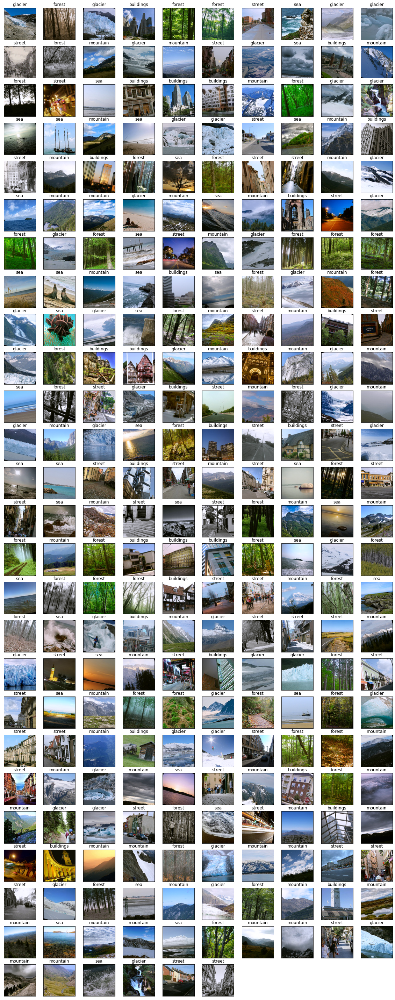

In [12]:
# visualize sample train data
visualize (loaders['train'], batch_size, classes)    

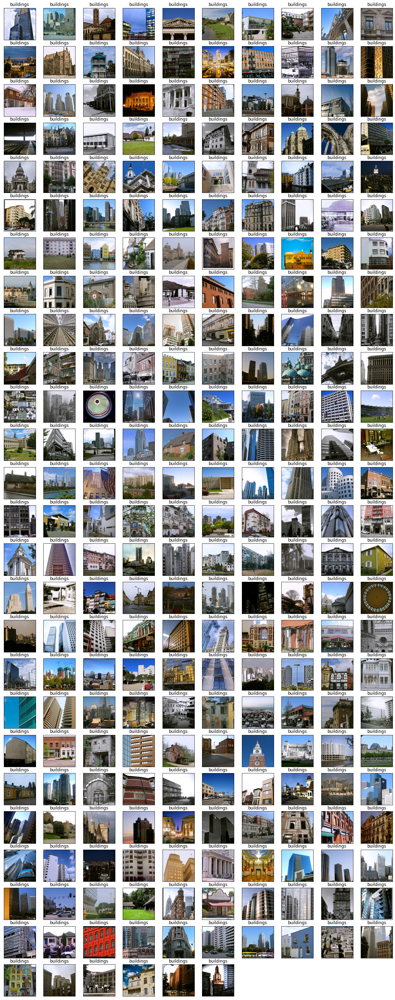

In [13]:
# visualize sample test data
visualize (loaders['test'], batch_size, classes)    

## Obtain model architecture

In [14]:
#load the pretrained model from pytorch
if pretrained_model=='resnet50':
  model_transfer = models.resnet50(pretrained=True)
elif pretrained_model=='wide_resnet50_2':
    model_transfer=models.wide_resnet50_2(pretrained=True)
elif pretrained_model=='shufflenet_v2_x1_0':
    model_transfer=models.shufflenet_v2_x1_0(pretrained=True)
elif pretrained_model=='resnext50_32x4d':
    model_transfer=models.resnext50_32x4d(pretrained=True)
elif pretrained_model=='squeezenet1_1':
    model_transfer = models.squeezenet1_1(pretrained=True)

# print out the model structure
print(model_transfer)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1,

In [15]:
# freeze training for all 'features' layers
for param in model_transfer.parameters():
    param.requires_grad = False
    
# final classifier layer
n_inputs = model_transfer.fc.in_features
#add last linear layer (n_inputs -> 6 classes)
#new layer automatically has require_grad = True
last_layer = nn.Linear(n_inputs, 6)
model_transfer.fc = last_layer

# if GPU is available, move the model to GPU
if train_on_gpu:
    model_transfer = model_transfer.cuda()

In [16]:
summary(model_transfer, (3, input_size, input_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

## Specify Loss Function, Optimizer and learning rate scheduler

In [17]:
# loss function: Categorical cross-entropy loss
criterion = criterion_type

# optimizer: stochastic gradient descent
if optimizer_type == 'SGD':
    optimizer = optim.SGD(model_transfer.parameters(), lr=.001, momentum=0.9)
else:
    optimizer =optim.Adam(model_transfer.parameters(), lr = 0.001)

In [18]:
"""
If lr_find is True, after running this cell, assign the scheduler's max_lr to 
the suggested maximum lr and then set lr_find to False in the "Set the parameters"
section. Set the lr in the optimizer 1/10 of max_lr. Then re_run the code. 
"""
if lr_find == False:
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01,
                                                    steps_per_epoch=len(loaders['train']),
                                                    epochs=n_epochs)     
else:
    #https://github.com/davidtvs/pytorch-lr-finder
    desired_batch_size, real_batch_size = batch_size, batch_size
    accumulation_steps = desired_batch_size // real_batch_size
    lr_finder = LRFinder(model_transfer, optimizer, criterion, device='cuda')
    lr_finder.range_test(loaders['train'], end_lr=0.05, num_iter=100, step_mode='exp')
    lr_finder.plot() # to inspect the loss-learning rate graph
    lr_finder.reset() # to reset the model and optimizer to their initial state"""

## Train and validate the model

In [19]:
def train(n_epochs, loaders, model, optimizer, criterion, train_on_gpu, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss and maximum validation accuracy
    valid_loss_min = np.Inf 
    valid_acc_max = 0
    loss_epoch =[]
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss, number of
        # correct predictions, number of samples per epoch, validation accuracy
        train_loss = 0.0
        valid_loss = 0.0
        corrects=0
        total = 0

        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
             
            # clear the gradients of all optimized variable
            optimizer.zero_grad() 
            # forward pass
            output = model(data) 
            # calculate the batch loss
            loss = criterion (output, target) 
            # backpropagation
            loss.backward() 
            # Update weigths
            optimizer.step() 
            # update training loss
            train_loss +=  ((1 / (batch_idx + 1)) * (loss.data - train_loss))
                      
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            # forward pass
            output = model(data)
            # calculate the batch loss
            loss = criterion (output, target)
            # update validation loss
            valid_loss +=  ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
                
            # convert output probabilities to predicted class
            pred = output.data.max(1, keepdim=True)[1]
            #count the number of correct predictions
            corrects += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            #update number of samples
            total += data.size(0)
            
        validation_accuracy = 100. * corrects / total
            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.3f}% '.format(
            epoch, 
            train_loss,
            valid_loss,
            validation_accuracy
            ))
        
        if (valid_loss < valid_loss_min) and (validation_accuracy > valid_acc_max ):
            print('Validation loss decreased ({:.6f} --> {:.6f}) and Validation\
             accuracy increased ({:.3f}% --> {:.3f}%!).  Saving model ...'.format(
                 valid_loss_min, valid_loss, valid_acc_max, validation_accuracy))            
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            valid_acc_max = validation_accuracy

        loss_epoch.append((epoch, train_loss.item(), valid_loss.item(), validation_accuracy))

    #save the loss_epoch history
    df=pd.DataFrame.from_records(loss_epoch, columns=['epoch','Train_loss', 'Validation_loss', 'Validation accuracy'])
    df.to_csv('loss.csv', index=False)       
    # return trained model
    return model


In [20]:
# train the model
model_transfer = train(n_epochs, loaders, model_transfer, optimizer, criterion, train_on_gpu, 'model_transfer.pt')

# load the model that got the best validation accuracy 
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Epoch: 1 	Training Loss: 1.069359 	Validation Loss: 0.626629 	Validation Accuracy: 84.212% 
Validation loss decreased (inf --> 0.626629) and Validation             accuracy increased (0.000% --> 84.212%!).  Saving model ...
Epoch: 2 	Training Loss: 0.507205 	Validation Loss: 0.429537 	Validation Accuracy: 87.420% 
Validation loss decreased (0.626629 --> 0.429537) and Validation             accuracy increased (84.212% --> 87.420%!).  Saving model ...
Epoch: 3 	Training Loss: 0.397668 	Validation Loss: 0.375079 	Validation Accuracy: 88.168% 
Validation loss decreased (0.429537 --> 0.375079) and Validation             accuracy increased (87.420% --> 88.168%!).  Saving model ...
Epoch: 4 	Training Loss: 0.352907 	Validation Loss: 0.338268 	Validation Accuracy: 89.202% 
Validation loss decreased (0.375079 --> 0.338268) and Validation             accuracy increased (88.168% --> 89.202%!).  Saving model ...
Epoch: 5 	Training Loss: 0.330185 	Validation Loss: 0.329208 	Validation Accuracy: 88.

<All keys matched successfully>

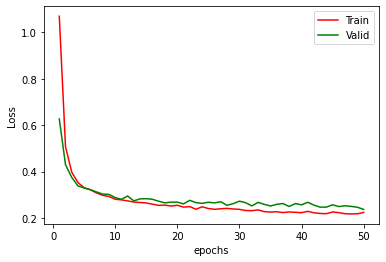

In [21]:
# plot the variation of train and validation losses vs n_epochs
loss=pd.read_csv('loss.csv',header=0,index_col=False)
plt.plot(loss['epoch'],loss['Train_loss'],'r',loss['epoch'],loss['Validation_loss'],'g')
plt.xlabel('epochs')
plt.ylabel('Loss')
plt.legend(labels=['Train','Valid'])
plt.show()

## Test the model

In [22]:
def classification_results(loaders, model, train_on_gpu):
    model.eval()
    y_pred = []
    y_true = []
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        pred = output.data.max(1, keepdim=True)[1]
        y_pred.extend(pred.cpu().numpy())
        y_true.extend(target.cpu().numpy())

    return  y_true, y_pred

y_true, y_pred = classification_results(loaders, model_transfer, train_on_gpu)

####Confusion matrix

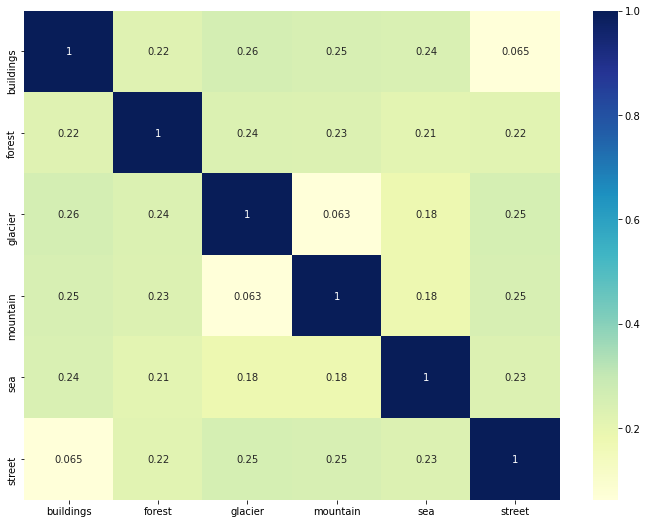

In [23]:
 # Obtain and plot confusion matrix
conf_mat = confusion_matrix(y_true, y_pred, normalize='true')
df_cm = pd.DataFrame(conf_mat, index=classes, columns=classes)
#df_cm.index.name = 'Actual'
#df_cm.columns.name = 'Predicted'
fig, ax = plt.subplots(figsize=(12,9))
sns.heatmap(df_cm.corr().abs(),  annot=True, cmap="YlGnBu")


####Classification report

In [24]:
"""
Precision – Accuracy of positive predictions: Precision = TP/(TP + FP) 
Recall (aka sensitivity or true positive rate): Fraction of positives that were correctly identified. Recall = TP/(TP+FN)
F1 Score (aka F-Score or F-Measure) –  The harmonic mean of precision and recall. F1 = 2 x (precision x recall)/(precision + recall)
"""
precision, recall, fscore, support = score(y_true, y_pred)
print(classification_report(y_true,y_pred, target_names=classes))

print('Mean recall: {0:.2%}'.format(np.mean(recall)))
print('Mean precision: {0:.2%}'.format(np.mean(precision)))
idx = np.argmin(precision)
print('Class with the lowest precision: {} - {}'.format(classes[idx], precision[idx]))
idx = np.argmin(recall)
print('Class with the lowest recall: {} - {}'.format(classes[idx], recall[idx]))

              precision    recall  f1-score   support

   buildings       0.90      0.94      0.92       437
      forest       0.98      0.99      0.99       474
     glacier       0.86      0.85      0.85       553
    mountain       0.87      0.82      0.84       525
         sea       0.92      0.96      0.94       510
      street       0.94      0.92      0.93       501

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.91      0.91      0.91      3000

Mean recall: 91.31%
Mean precision: 91.12%
Class with the lowest precision: glacier - 0.8587155963302753
Class with the lowest recall: mountain - 0.8228571428571428


#### Obtain information about misclassified classes

In [25]:
# this function is written based on batch_size=1, hence a different loader is defined for it
def misclassified_info(loader, classes, model, train_on_gpu):
    model.eval()
    misclassified=dict.fromkeys(classes)
    for key in misclassified.keys():
        misclassified[key]=[]
    classes_cnt=[0]*len(classes)
    for data,target in loader:
        if train_on_gpu:        
            data= data.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        idx = output.data.max(1, keepdim=True)[1]
        pred = classes[idx]
        if pred!= classes[target.item()]:
            misclassified[classes[target.item()]].append(pred)
        classes_cnt[target.item()] +=1
    
    # obtain the number of instances in each class
    instances=[classes[i]+':'+str(cnt) for i, cnt in enumerate(classes_cnt)]

    misclassified_cnt=dict.fromkeys(classes)
    for key in misclassified.keys():
        misclassified_cnt[key]=Counter(list(misclassified[key]))
    df_mc_cnt=pd.DataFrame.from_dict(misclassified_cnt).fillna(0)

    return df_mc_cnt, instances

test_dataloader = torch.utils.data.DataLoader(images_datasets['test'],batch_size=1, 
                                                num_workers=0)
df_mc_cnt, instances = misclassified_info(test_dataloader, classes, model_transfer, train_on_gpu)  
# number of images in each class   
print('Number of instances in each class:')
print(instances)
print()
#Table of wrong predictions per class
print(df_mc_cnt)          

Number of instances in each class:
['buildings:437', 'forest:474', 'glacier:553', 'mountain:525', 'sea:510', 'street:501']

           buildings  forest  glacier  mountain  sea  street
street          23.0     0.0      2.0       1.0  1.0     0.0
glacier          2.0     0.0      0.0      66.0  9.0     0.0
sea              1.0     2.0     22.0      19.0  0.0     1.0
buildings        0.0     1.0      1.0       5.0  0.0    40.0
mountain         0.0     0.0     57.0       0.0  8.0     1.0
forest           0.0     0.0      3.0       2.0  3.0     0.0


## Predict and visualize the labels of the 'pred' set

Number of prediction images: 7301


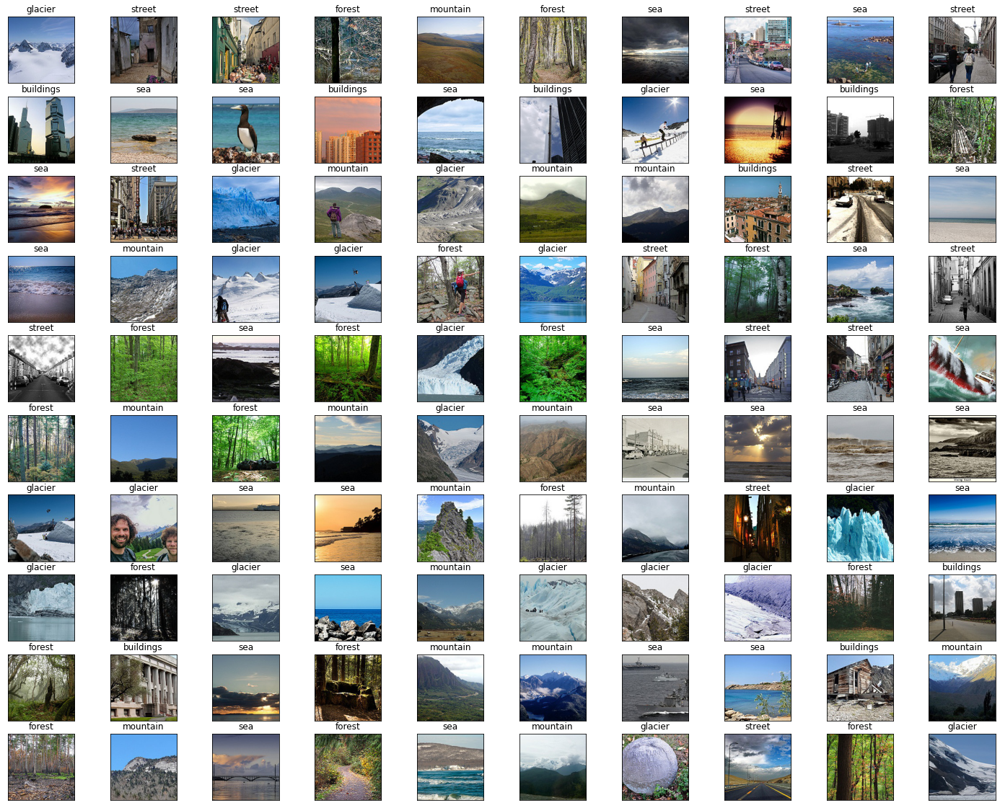

In [26]:
# prediction function
def predict(img_path, model, train_on_gpu):
    model.eval()
    # load the image and return the prediction
    img = Image.open(img_path)
    img = data_transforms['test'](img)
    if train_on_gpu:
        img = img.cuda()
    output = model(torch.unsqueeze(img, 0))
    idx = torch.argmax(output, dim=1)
    return classes[idx]

# visualize sample of predictions
def pred_plot(files, model, train_on_gpu):
    n=len(files)//10
    fig = plt.figure(figsize=(25,2*n))
    for i,f in enumerate(files):
        ax = fig.add_subplot(n, 10, i+1, xticks=[], yticks=[])
        pred = predict(f, model, train_on_gpu)
        img = Image.open(f)
        img = np.array(img)
        plt.imshow(img)
        plt.title(pred)

files=np.array(glob("/content/seg_pred/seg_pred/*.jpg"))
print("Number of prediction images:",len(files))
#random.shuffle(files)

pred_plot(files[0:100], model_transfer, train_on_gpu)